In [24]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


from glob import glob
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize
from csbdeep.utils.plot_utils import *
from csbdeep.data.transform import Transform

from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from stardist.models import Config2D, StarDist2D, StarDistData2D
from stardist.models.sample_patches import sample_patches

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

import gputools

from one_cycle_lr.lr_finder import *

np.random.seed(42)
lbl_cmap = random_label_cmap()

%reload_ext autoreload
%autoreload 2

In [ ]:
arch = 'unet2'
arch == 'unet' | 'unet2' or _raise(NotImplementedError())

## Load sample data

In [25]:
X = sorted(glob('/home/qzt/data/centuri/train/images/*.tif'))
Y = sorted(glob('/home/qzt/data/centuri/train/masks/*.tif'))
# X = sorted(glob('/home/qzt/data/dsb2018_sub1/images/*.tif'))
# Y = sorted(glob('/home/qzt/data/dsb2018_sub1/masks/*.tif'))
assert all(Path(x).name==Path(y).name for x,y in zip(X,Y))
X[0]

'/home/qzt/data/centuri/train/images/V1a-DMSO-x40-E1-2.tif'

In [26]:
X = list(map(imread,X))
Y = list(map(imread,Y))

n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()

X = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X)]
Y = [fill_label_holes(y) for y in tqdm(Y)]

100%|██████████| 5/5 [00:00<00:00, 51.73it/s]


In [27]:
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]

#manual assign train/val index for debugging
ind_train = [1,2,3,4]
ind_val = [0]

X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train] 
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images:   5
- training:         4
- validation:       1


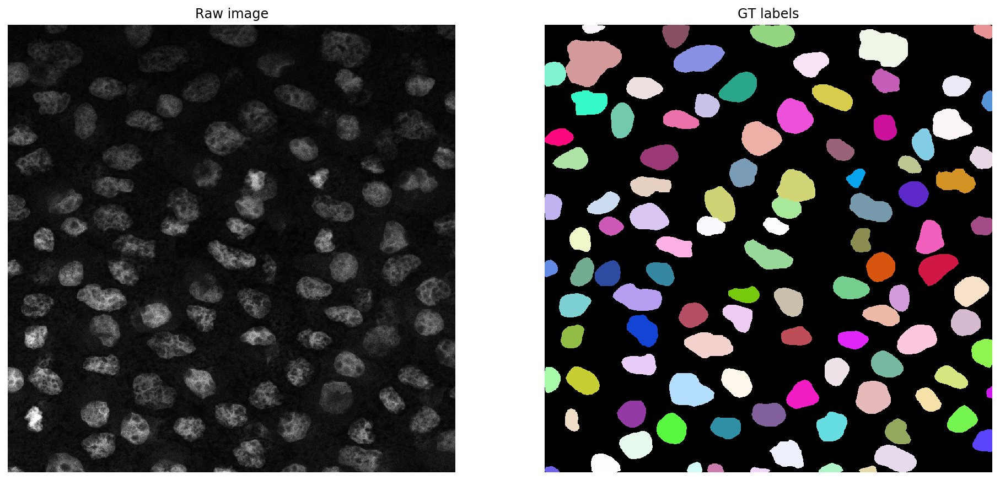

In [28]:
i = 0
img, lbl = X[i], Y[i]
img, lbl = X_val[0], Y_val[0]
assert img.ndim in (2,3)
img = img if (img.ndim==2 or img.shape[-1]==3) else img[...,0]
plt.figure(figsize=(16,10))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap); plt.axis('off'); plt.title('GT labels')
None;

## Try with other augmentation packages and use stardist generator pipe (keras sequence) 

In [120]:
# import cv2
from albumentations import *

In [132]:
ranf = list(np.random.ranf(8)/5)
AUGMENTATIONS_TRAIN = Compose([
    Flip(p=0.5),
    ShiftScaleRotate(scale_limit=(0.6, 0.1), rotate_limit=15, interpolation=0, border_mode=4, value=None, mask_value=None, always_apply=False, p=1),
    CoarseDropout(max_holes=64, max_height=8, max_width=8, min_holes=None, min_height=None, 
                  min_width=None, fill_value=ranf, always_apply=False, p=0.9),
    GaussNoise(var_limit=(0.0, 0.15), mean=0, p=0.5),
    GaussianBlur(blur_limit=33,p=0.5),
    ElasticTransform(alpha=100, sigma=7, alpha_affine=1, p=0.7, 
                    interpolation=0, border_mode=4, value=0, mask_value=0)
], p=0.99)

In [8]:
# data_train = StarDistData2D(X_trn, Y_trn, batch_size=32, n_rays=32, patch_size=(256,256), grid=(2,2), augmenter=AUGMENTATIONS_TRAIN, shape_completion=False)


# XX, YY = data_train[0]

# X,dist_mask = XX
# prob,dist = YY

# plot_some(X, dist_mask, prob, dist, x_inch=30, y_inch=20)

## Debug validation data part

In [27]:
validation_data=(X_val,Y_val)
data_kwargs = {'n_rays': 32, 'patch_size': (256, 256), 'grid': (2, 2), 'shape_completion': False, 'b': 32, 'use_gpu': False, 'foreground_prob': 0.9}
data_val = StarDistData2D(*validation_data, batch_size=1, **data_kwargs)

## Dig into the model

In [133]:
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
# use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = True,
    n_channel_in = n_channel,
    train_batch_size = 1,  #no gpu
    train_epochs = 400,
    train_steps_per_epoch = 10,
    train_one_cycle_lr_max = None,
    train_foreground_only=0.99,
    train_loss_weights=(1,0.2),
    y_range = None,
#     net_input_shape=(256, 256, 1), 
    unet_dropout=0.2,
    EDT_prob_threshold=0.7, 
    norm_by_mask=False,
#     net_input_shape = (256,256,1),
#     unet_batch_norm=True,
    train_learning_rate=5e-6  #(3e-3)
    
#     net_input_shape = (X_trn[0].shape[0], X_trn[0].shape[1], n_channel)
)

conf

Config2D(EDT_prob_threshold=0.7, axes='YXC', backbone='unet', feature_dropout=0, grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), norm_by_mask=False, train_background_reg=0.0001, train_batch_size=1, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.99, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_one_cycle_lr_max=0.0001, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=10, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.2, unet_kernel_init='he_uniform', unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, u

In [134]:
model = StarDist2D(conf, name='stardist_tune', basedir='unet01_oclr3e-4')

Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.541716, nms_thresh=0.3.


In [11]:
model.keras_model.summary()
# #check the trainable status in each layer
# for l in model.keras_model.layers:
#     print(l, l.trainable)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              (None, None, None, 1 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 320         input[0][0]                      
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, None, None, 3 9248        conv2d_1[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, None, None, 3 0           conv2d_2[0][0]                   
____________________________________________________________________________________________

## Freeze all the layers except the last n 

In [10]:
for l in model.keras_model.layers:
    print(l, l.trainable)

<keras.engine.input_layer.InputLayer object at 0x7f4ea419ecd0> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea41ab390> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea75ae110> True
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea41abad0> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea4110f50> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea4127290> True
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea4110ad0> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea40d6210> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea40d6d50> True
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea4110d90> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea4098890> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea40b5290> True
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea41276d0> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea4077990> True
<keras.layers.convolutional.Conv2D object at 0x7f4ea4077790> True
<keras.

In [11]:
# freeze all the layers except the last 3 --> only keep feature layer, prob, dist trainable
for l in model.keras_model.layers[:-5]:
    l.trainable = False

for l in model.keras_model.layers:
    print(l, l.trainable)

<keras.engine.input_layer.InputLayer object at 0x7f4ea419ecd0> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea41ab390> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea75ae110> False
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea41abad0> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea4110f50> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea4127290> False
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea4110ad0> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea40d6210> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea40d6d50> False
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea4110d90> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea4098890> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea40b5290> False
<keras.layers.pooling.MaxPooling2D object at 0x7f4ea41276d0> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea4077990> False
<keras.layers.convolutional.Conv2D object at 0x7f4ea4077790>

model need to be compiled again after setting the trainable state

In [12]:
model.prepare_for_training()
model.keras_model.optimizer

## load pretrained model

In [78]:
model = StarDist2D(None, name='stardist_tune', basedir='unet01')
model.config

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


Config2D(EDT_prob_threshold=0.7, axes='YXC', backbone='unet', feature_dropout=0, grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=[None, None, 1], net_mask_shape=[None, None, 1], norm_by_mask=False, train_background_reg=0.0001, train_batch_size=1, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=800, train_foreground_only=0.99, train_learning_rate=0.0003, train_loss_weights=[1, 0.2], train_n_val_patches=None, train_one_cycle_lr_max=0.003, train_patch_size=[256, 256], train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.2, unet_kernel_init='he_uniform', unet_kernel_size=[3, 3], unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, u

In [117]:
model = StarDist2D(None, name='stardist_tune', basedir='unet01_oclr3e-4')
if not model._model_prepared:
    model.prepare_for_training()
    print('model prepared/compiled')
model.config

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.541716, nms_thresh=0.3.
model prepared/compiled


Config2D(EDT_prob_threshold=0.7, axes='YXC', backbone='unet', feature_dropout=0, grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=[None, None, 1], net_mask_shape=[None, None, 1], norm_by_mask=False, train_background_reg=0.0001, train_batch_size=1, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.99, train_learning_rate=0.0003, train_loss_weights=[1, 0.2], train_n_val_patches=None, train_one_cycle_lr_max=0.0003, train_patch_size=[256, 256], train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0, 'verbose': True}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.2, unet_kernel_init='he_uniform', unet_kernel_size=[3, 3], unet_last_activation='relu', unet_n_conv_per_depth=2,

In [135]:
# load weights into current model in h5 format (keras)
model.keras_model.load_weights("unet01_oclr3e-4/stardist_tune/backup_weights_last.h5")
print("Weight Loaded from disk")

Weight Loaded from disk


In [24]:
# load weights into current model in h5 format (keras)
model.keras_model.load_weights("tune_a1_xenopus/stardist_tune/weights_last.h5")
print("Loaded model from disk")

Loaded model from disk


In [13]:
# load weights into current model in h5 format (keras)
model.keras_model.load_weights("../../models/stardist_depth_3_augment_True_grid_2_2_epochs_800/weights_last.h5")
print("Loaded model from disk")

Loaded model from disk


In [131]:
AUGMENTATIONS_TRAIN

Compose([
  Flip(always_apply=False, p=0.5),
  ShiftScaleRotate(always_apply=False, p=1, shift_limit=(-0.0625, 0.0625), scale_limit=(0.8999999999999999, 0.5), rotate_limit=(-15, 15), interpolation=0, border_mode=4, value=None, mask_value=None),
  CoarseDropout(always_apply=False, p=0.9, max_holes=64, max_height=8, max_width=8, min_holes=64, min_height=8, min_width=8),
  GaussNoise(always_apply=False, p=0.5, var_limit=(0.0, 0.15)),
  GaussianBlur(always_apply=False, p=0.5, blur_limit=(3, 33)),
  ElasticTransform(always_apply=False, p=0.7, alpha=100, sigma=7, alpha_affine=1, interpolation=1, border_mode=4, value=0, mask_value=0, approximate=False),
], p=0.99, bbox_params=None, keypoint_params=None, additional_targets={})

## Test LRFinder 

In [98]:
# model is a Keras model
lr_finder = LRFinder(model.keras_model)

# Train a model with batch size 512 for 5 epochs
# with learning rate growing exponentially from 0.0001 to 1
lr_finder.find(data_train, start_lr=1e-8, end_lr=1.0)

Epoch 1/13
8/8 [==============================] - 39s 5s/step - loss: 0.4211 - prob_loss: 0.0819 - dist_loss: 1.6961 - prob_kld: 0.0075 - dist_relevant_mae: 1.6956 - dist_relevant_mse: 10.5673
Epoch 2/13
1/8 [==>...........................] - ETA: 24s - loss: 0.3900 - prob_loss: 0.0809 - dist_loss: 1.5454 - prob_kld: 0.0080 - dist_relevant_mae: 1.5450 - dist_relevant_mse: 6.0112

Min. loss grad point, lr: 1.4454397678775877e-08, loss: 0.42443979530817066


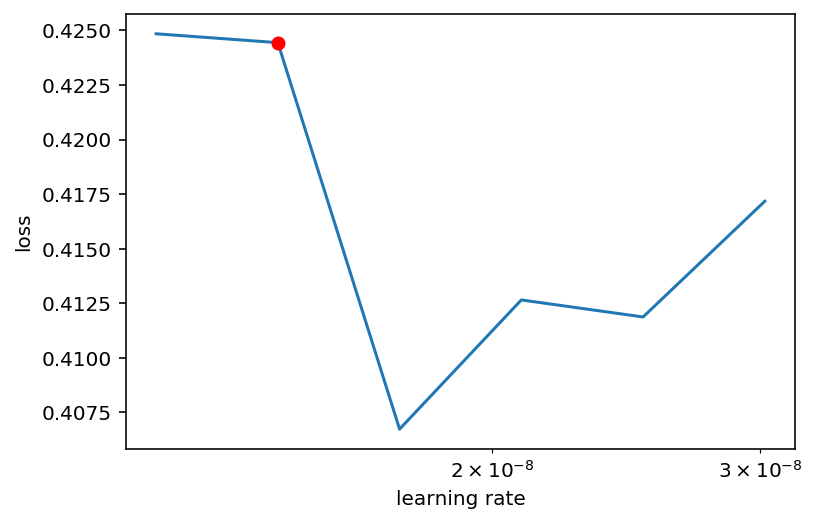

In [99]:
# Plot the loss, ignore 20 batches in the beginning and 5 in the end
lr_finder.plot_loss(skip_start=1, skip_end=1, suggestion=True)

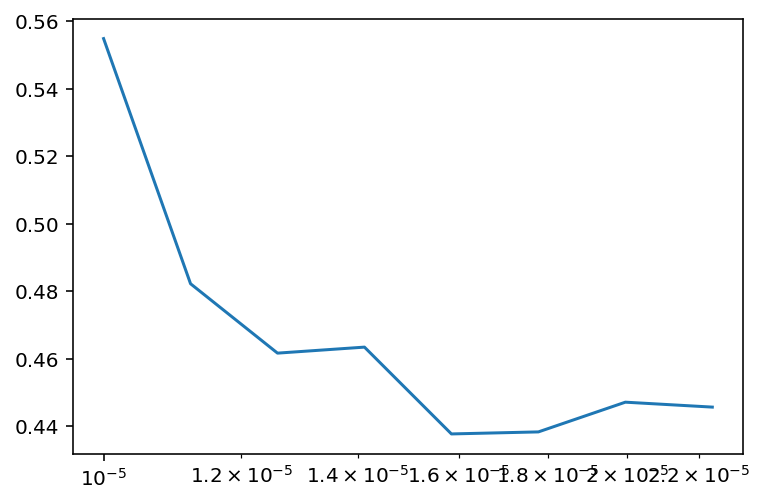

In [80]:
plt.plot(lr_finder.lrs, lr_finder.losses)
plt.xscale('log')

## Start training

In [136]:
# %debug
model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=AUGMENTATIONS_TRAIN)

Epoch 1/400
10/10 [==============================] - 7s 686ms/step - loss: 0.0783 - prob_loss: 0.0504 - dist_loss: 0.1395 - prob_kld: 0.0330 - dist_relevant_mae: 4.4690 - dist_relevant_mse: 42.4833 - val_loss: 0.0570 - val_prob_loss: 0.0392 - val_dist_loss: 0.0889 - val_prob_kld: 0.0216 - val_dist_relevant_mae: 2.9267 - val_dist_relevant_mse: 17.3306
- OneCycleScheduler, lr: 4.016448401173258e-06
Epoch 2/400
10/10 [==============================] - 4s 449ms/step - loss: 0.0666 - prob_loss: 0.0417 - dist_loss: 0.1244 - prob_kld: 0.0266 - dist_relevant_mae: 4.7562 - dist_relevant_mse: 49.4488 - val_loss: 0.0569 - val_prob_loss: 0.0393 - val_dist_loss: 0.0880 - val_prob_kld: 0.0216 - val_dist_relevant_mae: 2.8959 - val_dist_relevant_mse: 17.1174
- OneCycleScheduler, lr: 4.065782331780463e-06
Epoch 3/400
10/10 [==============================] - 4s 447ms/step - loss: 0.0677 - prob_loss: 0.0435 - dist_loss: 0.1212 - prob_kld: 0.0262 - dist_relevant_mae: 4.0247 - dist_relevant_mse: 33.6866 - 

KeyboardInterrupt: 

In [45]:
model.keras_model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              (None, 256, 256, 1)  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 256, 256, 32) 320         input[0][0]                      
__________________________________________________________________________________________________
conv2d_10 (Conv2D)              (None, 256, 256, 32) 9248        conv2d_9[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_5 (MaxPooling2D)  (None, 128, 128, 32) 0           conv2d_10[0][0]                  
____________________________________________________________________________________________

# Threshold optimization

While the default values for the probability and non-maximum suppression thresholds already yield good results in many cases, we still recommend to adapt the thresholds to your data. The optimized threshold values are saved to disk and will be automatically loaded with the model.

In [97]:
model.optimize_thresholds(X_val, Y_val)

NMS threshold = 0.5:  80%|████████  | 16/20 [00:03<00:00,  4.07it/s, 0.413 -> 0.773]


Using optimized values: prob_thresh=0.411618, nms_thresh=0.3.
Saving to 'thresholds.json'.


{'prob': 0.41161787409845074, 'nms': 0.3}

In [18]:
%pwd

'/home/qzt/stardist/examples/2D'

In [26]:
model.export_TF(fname='tune_a1_xenopus')

## Make predictions on test set

In [98]:
X = sorted(glob('/home/qzt/data/centuri/test/images/*.tif'))
X = list(map(imread,X))

In [99]:
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))

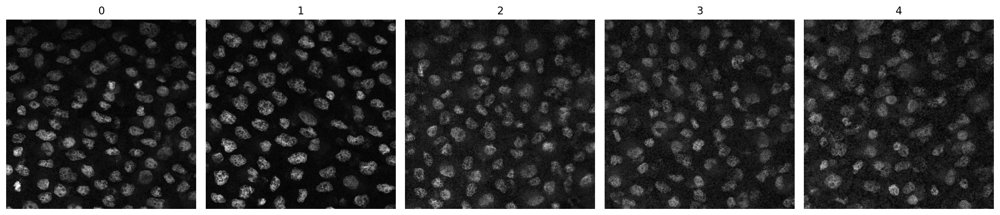

In [37]:
# # show all test images
# if True:
#     fig, ax = plt.subplots(1,5, figsize=(16,16))
#     for i,(a,x) in enumerate(zip(ax.flat, X)):
#         a.imshow(x if x.ndim==2 else x[...,0], cmap='gray')
#         a.set_title(i)
#     [a.axis('off') for a in ax.flat]
#     plt.tight_layout()
# None;

In [100]:
len(X_val)

1

In [110]:
model.keras_model.metrics_names

['loss',
 'prob_loss',
 'dist_loss',
 'prob_kld',
 'dist_relevant_mae',
 'dist_relevant_mse']

In [103]:

validation_data=(X_val,Y_val)
data_kwargs = {'n_rays': 32, 'patch_size': (256, 256), 'grid': (2, 2), 'shape_completion': False, 'b': 32, 'use_gpu': False, 'foreground_prob': 0.9}
data_val = StarDistData2D(*validation_data, batch_size=1, **data_kwargs)

model.keras_model.evaluate(data_val[0][0], data_val[0][1])

1/1 [==============================] - 0s 67ms/step


[4.110745429992676,
 0.9517650008201599,
 3.15898060798645,
 0.8066402077674866,
 23.684341430664062,
 793.0350341796875]

In [111]:
model.keras_model.evaluate(data_val[0][0], data_val[0][1])

1/1 [==============================] - 4s 4s/step


[1.623123288154602,
 1.2987858057022095,
 1.6216875314712524,
 1.146728515625,
 16.260944366455078,
 439.4966735839844]

In [104]:
def plot_prediction(img, prob, nms, figsize):
    img = normalize(X_val[0], 1,99.8, axis=axis_norm)
    labels, details = model.predict_instances(img, prob_thresh=0.1, nms_thresh=0.3 )

    
    plt.figure(figsize=figsize)
    plt.subplot(121)
    plt.imshow(img if img.ndim==2 else img[...,0], clim=(0,1), cmap='gray')
    plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
    plt.subplot(122)
    plt.imshow(img if img.ndim==2 else img[...,0], clim=(0,1), cmap='gray')
    plt.axis('off');


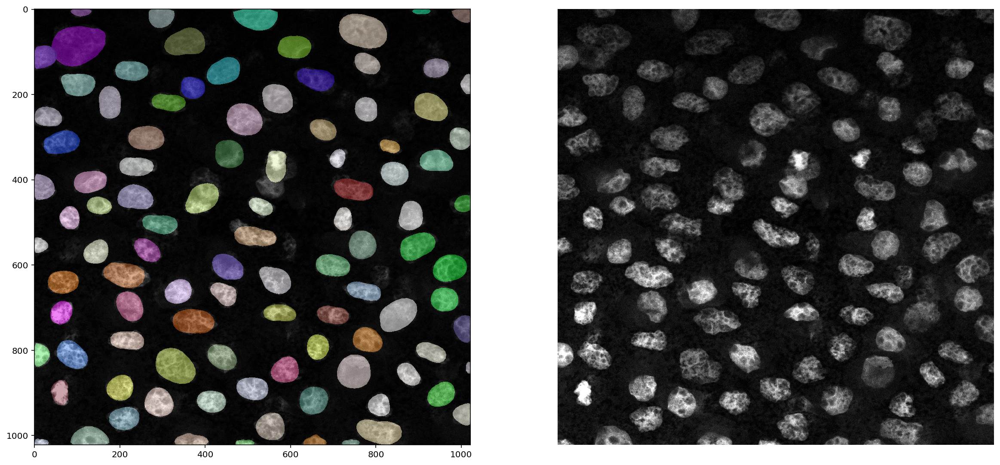

In [105]:
prob = 0.1
nms = 0.3
figsize = (20,20)
img = X_val[0]

plot_prediction(img, prob, nms, figsize)

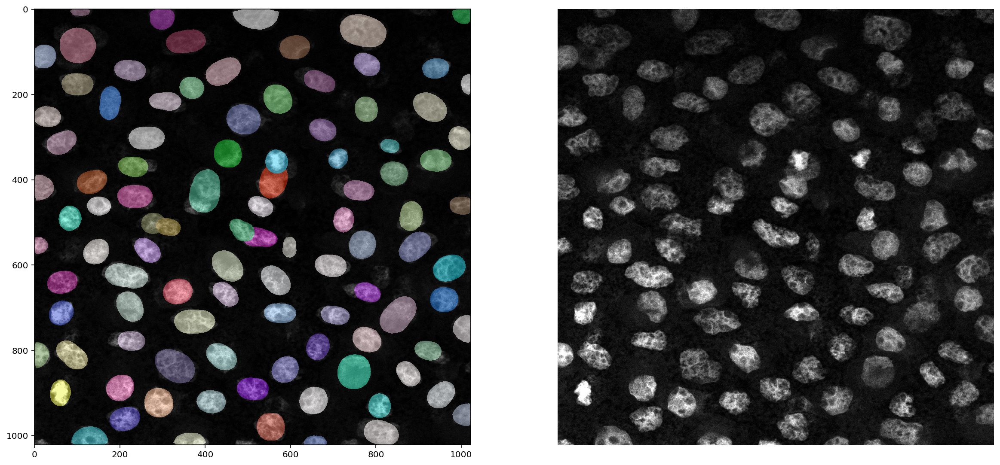

In [112]:
plot_prediction(img, prob, nms, figsize)

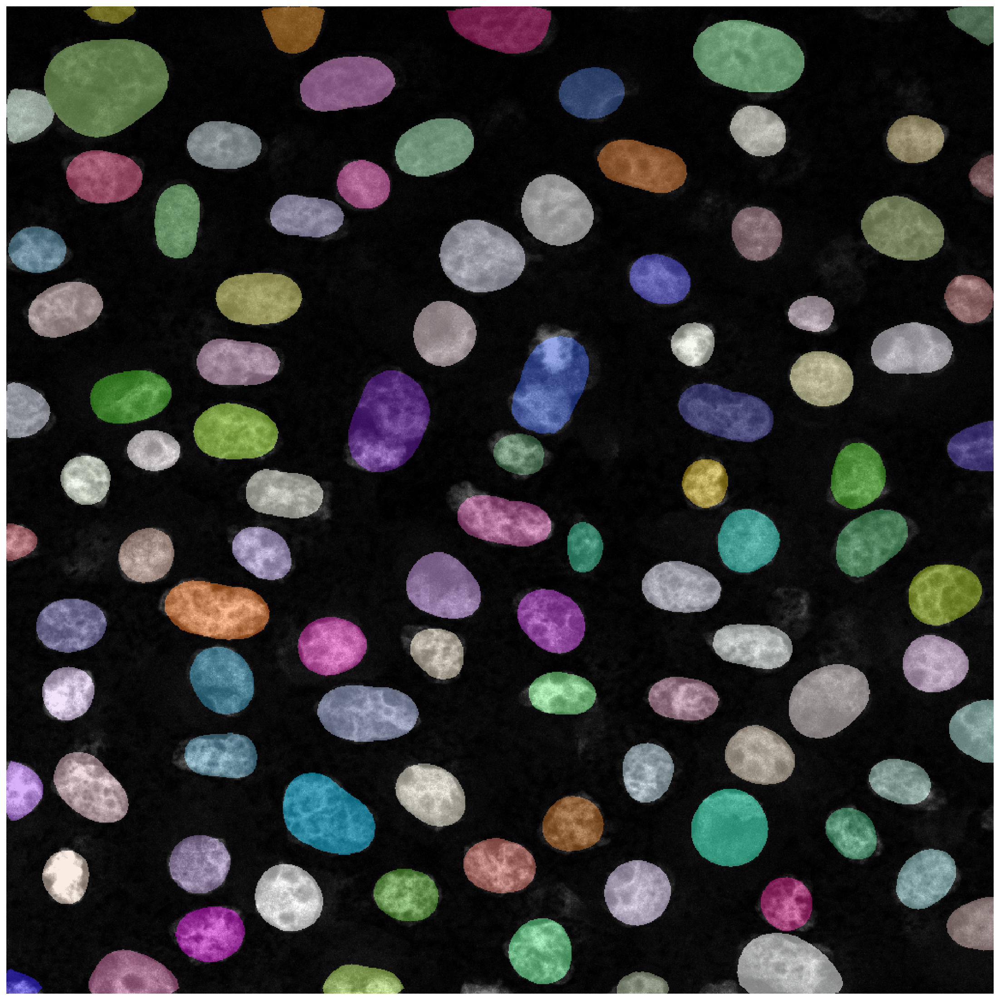

In [52]:
img = normalize(X_val[0], 1,99.8, axis=axis_norm)
labels, details = model.predict_instances(img, prob_thresh=0.1, nms_thresh=0.3 )

plt.figure(figsize=(20,20))
plt.imshow(img if img.ndim==2 else img[...,0], clim=(0,1), cmap='gray')
plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
plt.axis('off');

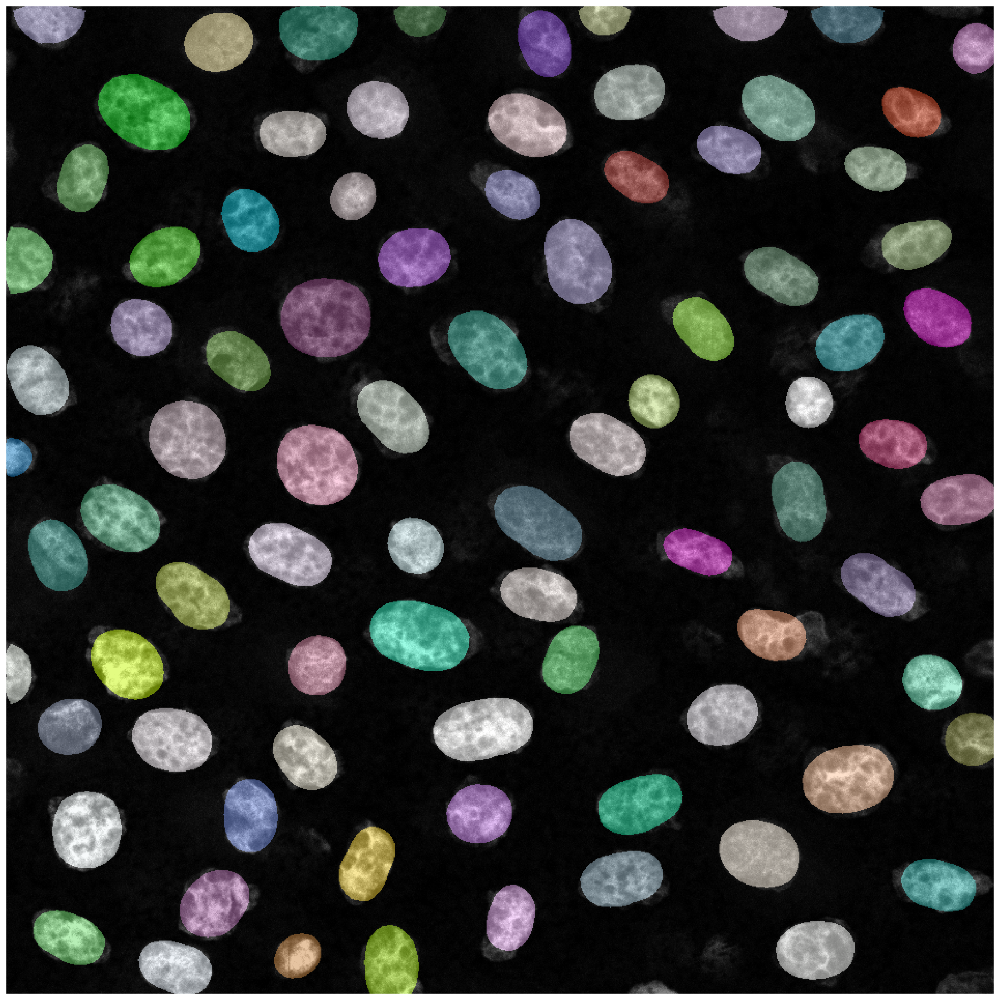

In [39]:
img = normalize(X_trn[0], 1,99.8, axis=axis_norm)
labels, details = model.predict_instances(img, prob_thresh=0.3, nms_thresh=0.1 )

plt.figure(figsize=(20,20))
plt.imshow(img if img.ndim==2 else img[...,0], clim=(0,1), cmap='gray')
plt.imshow(labels, cmap=lbl_cmap, alpha=0.5)
plt.axis('off');